<a href="https://colab.research.google.com/github/denniesbor/Final-Capstone-Project/blob/dev/capstone_detectron_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dennies Kiprono Bor
## DSI Capstone

### **Introduction**

Agriculture is an important sector in a our economy. Due to population growth, and effects of climate change there is need to adopt modern technologies to improve production, and sustain the existing population. In this notebook, we apply computer vision for animal behavior monitoring and activity recoqnition. The project is divided into three stages which is object detection, classification and tracking.

#### **Object detection**

Training a model from scratch is computationally expensive, time consuming, and requires lots of iteration and several architecturial tweaks to give desirable results. Transfer learning is essential for our case, and requires only finetuning to detect and classify the objects we are intrested in.

The model weights of our project are trained on COCO dataset. COCO or common objects in context is a large-scale object detection, segmentation, and captioning dataset comprosing of 90 objects.  Cows are part of this dataset, meaning the models are aware of our custom dataset. The advantage is we need little finetuning unlike building the neural network from scratch.

The models architecture comprises of convolution and dense layers optimized to give the best performance.Object detection networks are classified as multi-stage or single stage. Examples of single staged neural nets are the SSD, YOLO, etc. The multi staged approaches uses the region proposal networks in their architectures to extract feature maps from the backbone. Examples of multi stage networks are the RCNN and RFCN.

We use a two stage neural network for this project, FRCNN because parameters are shared between the two stages creating an efficient framework for detection. R-CNN models is a multi layered conv neural network and consists of the feature extractor, a region proposal algorithm to generate bounding boxes, a regression and classification layer. R-CNNs tradeoff their speed for accuracy. They are generally slow on CPUs compared to single stage detectors, albeit with high accuracy.

#### **Tracking**.

The initial concept was to keep track of animal behavior by the use of memory cells such as LSTM. However this computationally expensive and opted for the use of Simple Online Realtime Tracking algorithm(SORT). SORT allows multiple object tracking(MOT) where each object is represented by a bounding box and attempts tp associate detections across frames in a video sequence. The algorithm utilizes Kalman filter for the prediction of the next object state.
The caveat for using algorithm is occluded objects are not tracked, and will be assigned new tracking id on reentry. For our case in tracking the cattle, some of the cattle are retracked once they disappear in the field of view, or reappear.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Working Directory**

In [ ]:
cd /content/drive/MyDrive/capstone/MultiviewC

/content/drive/MyDrive/capstone/MultiviewC


### **Download  the Trained Model Weights from Kaggle**

In [ ]:
# download the trained model from kaggle

# !wget "https://kkb-production.jupyter-proxy.kaggle.net/k/94757078/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2IiwidHlwIjoiSldUIn0..934LHbRgX3M7WpHZVsvQBA.CIkdmnNQf83gcwv_nmVJrp8IjTbv1vZ2mwIVzvLeSU629wMsDUH6Fmy45YZOO0YtMx_dypzxVdM9cpj4xCNGPd5U2liiH6hbwXoY9YhDOq1FXBGW68tHiZVxoO8RmdH7n7TL3VC3dyGR1zkYw-69FkGhyz2kSO0wkV7wCCIQOFRQnNs_Uq9iDa6R3mq0oTSdifmMmOCg_f-CI31H4cyiGg.0sQt2Y5xPIvTRhw7n2pbyQ/proxy/files/model_final.pth"

## **Install the Necessary Modules**
Detectron2 is Facebook AI Research's next generation library that provides state-of-the-art detection and segmentation algorithms. It is the successor of Detectron and maskrcnn-benchmark. It supports a number of computer vision research projects and production applications in Facebook.

In [ ]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

# install A 0.4.6
!pip install albumentations==0.4.6


import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 21 kB/s 
     |████████████████████████████████| 6.6 MB 56.0 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113:
      Successfully uninstalled torch-1.11.0+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0+cu113
    Uninstalling torchvision-0.12.0+cu113:
      Successfully uninstalled torchvision-0.12.0+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.12.0 requires torch==1.11.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.11.0+cu113 requires torch==1.11.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 6.9 MB/s 
  Created wheel fo

## **Install the Tracker**
We use Norfair which is a customizable lightweight library for object tracking.

Norfair works by estimating the future position of each point based on its past positions. It then tries to match these estimated positions with newly detected points provided by the detector. For this matching to occur, Norfair can rely on any distance function specified by the user of the library. Therefore, each object tracker can be made as simple or as complex as needed.

In [ ]:
#install norfair tracker
!pip install norfair[metrics,video]  # Everything included

     |████████████████████████████████| 177 kB 10.6 MB/s 
     |████████████████████████████████| 197 kB 49.3 MB/s 
     |████████████████████████████████| 151 kB 58.0 MB/s 
     |████████████████████████████████| 50 kB 6.8 MB/s 
     |████████████████████████████████| 64 kB 2.8 MB/s 
     |████████████████████████████████| 51 kB 7.1 MB/s 
     |████████████████████████████████| 42 kB 946 kB/s 
     |████████████████████████████████| 69 kB 8.3 MB/s 
     |████████████████████████████████| 99 kB 10.3 MB/s 
     |████████████████████████████████| 297 kB 58.3 MB/s 
     |████████████████████████████████| 297 kB 63.0 MB/s 
     |████████████████████████████████| 297 kB 55.4 MB/s 
     |████████████████████████████████| 296 kB 51.5 MB/s 
     |████████████████████████████████| 296 kB 49.5 MB/s 
     |████████████████████████████████| 280 kB 32.2 MB/s 
     |████████████████████████████████| 280 kB 68.4 MB/s 
     |████████████████████████████████| 280 kB 63.3 MB/s 
     |███████████████████

### **YouTube API**
The YouTube library allows us to evaluate the performance of our models using the copyright free videos from the YouTube site


In [ ]:
# install youtube downloader
!pip install yt_dlp
!pip install webvtt-py

     |████████████████████████████████| 2.6 MB 7.5 MB/s 
     |████████████████████████████████| 2.0 MB 36.0 MB/s 
     |████████████████████████████████| 218 kB 72.2 MB/s 
     |████████████████████████████████| 357 kB 65.4 MB/s 
     |████████████████████████████████| 112 kB 48.3 MB/s 


In [ ]:
# import some common libraries
import numpy as np
import pandas as pd
import cv2
import os
import random
import copy
from pathlib import Path
import matplotlib.pyplot as plt
import ast
import seaborn as sns

from collections import OrderedDict

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
import albumentations as A
from sklearn.model_selection import train_test_split
from detectron2.utils.logger import setup_logger
setup_logger()



# import some common detectron2 utilities
from detectron2.data import detection_utils as utils
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import load_coco_json
import detectron2.data.transforms as T

from detectron2.evaluation import COCOEvaluator, inference_on_dataset

In [ ]:
# import bbox tracking utilities

from google.colab.patches import cv2_imshow
from norfair import Detection, Tracker, Video, draw_tracked_objects,draw_boxes,draw_points

### **Initial Setup**

In [ ]:
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
BASE_DIR = '/content/drive/MyDrive/capstone/MultiviewC'

NUM_EPOCHS = 8

## **Dataset**
The dataset contains cattle videos which are pre recorded in the farm during the day. The video annotations are in CVAT format, and the custom dataset in Pascal Voc. We need to transform these annotations into a COCO format before loading into the detector.
The animal activities are contained in the video vtt files, and we need to parse them to extract the frame by frame annotations.
Helper python files used in these transformations are attached alongside this notebook.

In [ ]:
df = pd.read_csv('train.csv')
df['annotations'] = df['annotations'].apply(eval)

df_val = df[df.camera_id.isin(['C1', 'C2'])].reset_index(drop=True)
df_train = df[~df.camera_id.isin(['C1', 'C2'])].reset_index(drop=True)

### **Custom Dataset**
The model performs poorly on random videos, nearfield to the camera. Data augmentation can suffice, but the results are poor. We annotate random videos from YouTube which then we will retrain our model on.

In [ ]:
custom_df = pd.read_csv('custom.csv')
custom_df['annotations'] = custom_df['annotations'].apply(eval)
custom_df['image_id'] = 'custom_'+custom_df['image_id']
# df_train, df_val = train_test_split(custom_df, test_size=0.02, random_state=42)

In [ ]:
df.head(5)

,camera_id,image_id,annotations,image_path
0,C1,0,"[{'xmin': 347, 'ymin': 292, 'xmax': 478, 'ymax...",images/C1/0000.png
1,C1,1,"[{'xmin': 345, 'ymin': 294, 'xmax': 480, 'ymax...",images/C1/0001.png
2,C1,2,"[{'xmin': 337, 'ymin': 304, 'xmax': 490, 'ymax...",images/C1/0002.png
3,C1,3,"[{'xmin': 337, 'ymin': 304, 'xmax': 490, 'ymax...",images/C1/0003.png
4,C1,4,"[{'xmin': 347, 'ymin': 292, 'xmax': 478, 'ymax...",images/C1/0004.png


## **Resize the Images**

In [ ]:
def resize_image(img_arr, bboxes, h, w):
    """
    :uses ALbumentations library
    :param img_arr: original image as a numpy array
    :param bboxes: bboxes as numpy array where each row is 'x_min', 'y_min', 'x_max', 'y_max', "class_id"
    :param h: resized height dimension of image
    :param w: resized weight dimension of image
    :return: dictionary containing {image:transformed, bboxes:['x_min', 'y_min', 'x_max', 'y_max', "class_id"]}
    """
    # create resize transform pipeline
    transform = A.Compose(
        [A.Resize(height=h, width=w, always_apply=True)],
        bbox_params=A.BboxParams(format='pascal_voc'))
    transformed = transform(image=img_arr, bboxes=bboxes)
    return transformed


In [ ]:
ratio = []
size = []

for i, anotation in enumerate(df.annotations):
    if len(anotation)>2:
        boxes = df.iloc[i].annotations
        
        for j, box in enumerate(boxes):
            bbox = list(box.values())
            ratio.append(((bbox[2] / bbox[3]),(bbox[2] * bbox[3])))
            size.append((bbox[2], bbox[3]))



Extract the bounding boxes sizes and their ratios

In [ ]:
df_boxes = pd.DataFrame(ratio, columns=["aspect_ratio", "box_area"])
df_sizes = pd.DataFrame(size, columns=["w", "h"])

In [ ]:
df_boxes.describe()

,aspect_ratio,box_area
count,53361.000000,5.336100e+04
mean,1.969318,2.287390e+05
std,1.039518,1.430204e+05
min,0.010381,6.390000e+02
25%,1.136919,1.290000e+05
50%,1.801120,1.981980e+05
75%,2.707937,2.987820e+05
max,5.504202,1.546878e+06


In [ ]:
df_sizes.describe()

,w,h
count,53361.000000,53361.000000
mean,642.757182,351.311894
std,302.472577,114.299212
min,3.000000,185.000000
25%,406.000000,277.000000
50%,637.000000,314.000000
75%,853.000000,395.000000
max,1764.000000,990.000000


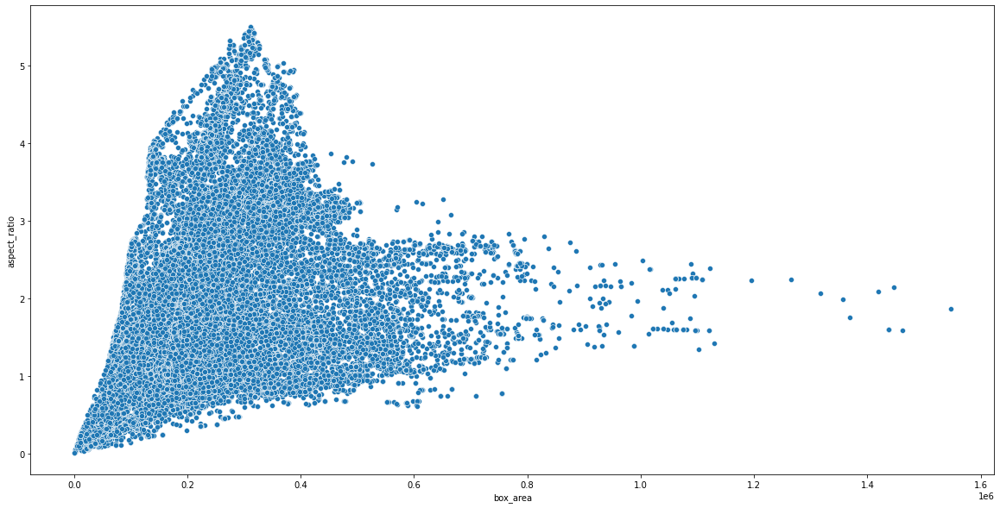

In [ ]:
fig, ax = plt.subplots(1, 1, figsize =(20,10))

ax = sns.scatterplot(data=df_boxes, x="box_area", y="aspect_ratio")
plt.show()

## **Prepare the Dataset**

Convert the dataframe into COCO format.

In [ ]:
coco_train_id = 1
coco = {
    "info": {
        "year": "2021",
        "version": "1",
        "description": "Cattle Activity Recoqnition",
        "contributor": "PyTorch",
        "url": "",
        "date_created": "2021-11-29T19:36:39+00:00"
    },
    "licenses": [
        {
            "id": 1,
            "url": "https://creativecommons.org/publicdomain/zero/1.0/",
            "name": "Public Domain"
        }
    ],
    "categories": [
        {
            "id": 1,
            "name": "sleep"},
        {
            "id": 2,
            "name": "eat"},
        {
            "id": 3,
            "name": "idle"},
        {
            "id": 4,
            "name": "run"},
        {
            "id": 5,
            "name": "walk"},
         {
            "id": 6,
            "name": "drink"}
    ],
    "images": [],
    "annotations": []
}

In [ ]:
df_1 = df_train.copy()
for i, anotation in enumerate(df_1.annotations):
    filename = df_1.iloc[i].image_path.split('.')[0]
    if len(anotation)>2:
        coco["images"].append({"id": filename,
                               "license": 1,
                               "file_name":  str(df_1.iloc[i].image_path),
                               "height": 720,
                               "width":1280
                               })
        boxes = df_1.iloc[i].annotations
        for j, box in enumerate(boxes):
            new_box = {'x':box['xmin'],'y':box['ymin'],'w':box['xmax']-box['xmin'],'h':box['ymax']-box['ymin']}
            label = box['action']
            bbox = list(new_box.values())
            coco["annotations"].append({
                "id": coco_train_id + 1,
                "area": bbox[2] * bbox[3],
                "image_id": filename,
                "category_id": label,
                "bbox": bbox,
                "segmentation": [],
                "iscrowd": 0
            })
            coco_train_id+=1

In [ ]:
import json as json

with open('train_dataset_coco.json', 'w') as f:
    json.dump(coco, f)

In [ ]:
# test dataset
coco = {
    "info": {
        "year": "2021",
        "version": "1",
        "description": "Cattle Activity Recoqnition",
        "contributor": "PyTorch",
        "url": "",
        "date_created": "2021-11-29T19:36:39+00:00"
    },
    "licenses": [
        {
            "id": 1,
            "url": "https://creativecommons.org/publicdomain/zero/1.0/",
            "name": "Public Domain"
        }
    ],
    "categories": [
        {
            "id": 1,
            "name": "sleep"},
        {
            "id": 2,
            "name": "eat"},
        {
            "id": 3,
            "name": "idle"},
        {
            "id": 4,
            "name": "run"},
        {
            "id": 5,
            "name": "walk"},
          {
            "id": 6,
            "name": "drink"}
    ],
    "images": [],
    "annotations": []
}

In [ ]:
df_1 = df_val.copy()
for i, anotation in enumerate(df_1.annotations):
    filename = df_1.iloc[i].image_path.split('.')[0]
    if len(anotation)>2:
        coco["images"].append({"id": filename,
                               "license": 1,
                               "file_name":  str(df_1.iloc[i].image_path),
                               "height": 720,
                               "width":1280
                               })
        boxes = df_1.iloc[i].annotations
        for j, box in enumerate(boxes):
            new_box = {'x':box['xmin'],'y':box['ymin'],'w':box['xmax']-box['xmin'],'h':box['ymax']-box['ymin']}
            label = box['action']
            bbox = list(new_box.values())
            coco["annotations"].append({
                "id": coco_train_id,
                "area": bbox[2] * bbox[3],
                "image_id": filename,
                "category_id": label,
                "bbox": bbox,
                "segmentation": [],
                "iscrowd": 0
            })
            coco_train_id+=1

In [ ]:
import json as json

with open('test_dataset_coco.json', 'w') as f:
    json.dump(coco, f)

## **Data Augmentation**

In [ ]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

## **Detectron Data Preparation**

Register COCO dataset and build a custom trainer by iheriting from the default trainer. 

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

# default trainer class
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)


# register coco datasets
from detectron2.data.datasets import register_coco_instances
DatasetCatalog.clear()

register_coco_instances("coco_train_dataset", {}, "train_dataset_coco.json" , ".")
register_coco_instances("coco_test_dataset", {}, "test_dataset_coco.json" ,   ".")

dataset_train_metadata = MetadataCatalog.get("coco_train_dataset")
dataset_train = DatasetCatalog.get("coco_train_dataset")

dataset_test_metadata = MetadataCatalog.get("coco_test_dataset")
dataset_test = DatasetCatalog.get("coco_test_dataset")

[05/09 22:47:33 d2.data.datasets.coco]: Loaded 2800 images in COCO format from train_dataset_coco.json
[05/09 22:47:34 d2.data.datasets.coco]: Loaded 1120 images in COCO format from test_dataset_coco.json


### **Random Images**
To verify that the data loaded correctly, let's visualize the annotations of randomly selected samples in the training set:

./images/C4/0508.png
./images/C6/0005.png
./images/C4/0059.png


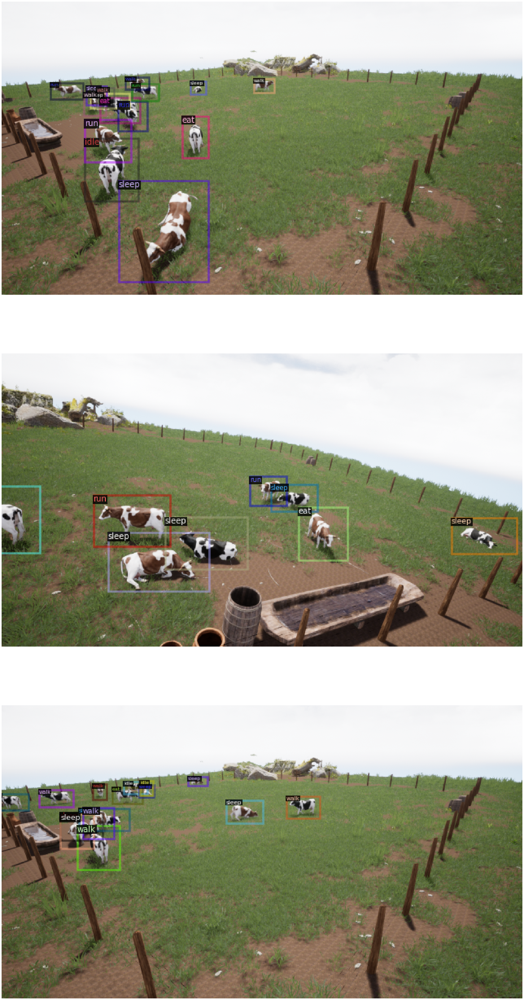

In [ ]:
import random
from detectron2.utils.visualizer import Visualizer

fig, ax = plt.subplots(3, 1, figsize =(100,80))
i=0

for d in random.sample(dataset_train, 3):
    print(d['file_name'])
    img = cv2.imread(d['file_name'])
    
    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    
    ax[i].grid(False)
    ax[i].axis('off')
    ax[i].imshow(cv2.cvtColor(vis.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    i += 1


## **Build the Model**

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))  # load default parameters for Mask R-CNN
cfg.DATASETS.TRAIN = ("coco_train_dataset",)  # dataset used for training model
cfg.DATASETS.TEST = ("coco_test_dataset", )  # we will look at the predictions on both sets after training

cfg.SOLVER.CHECKPOINT_PERIOD = 1000  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cuda'  # 'cuda' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6
cfg.SOLVER.MAX_ITER = 4000  # maximum number of iterations to run during training
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 4 # number of images per batch (across all machines)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8
cfg.TEST.EVAL_PERIOD = 100


cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[20], [58], [77], [130], [156]]
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.7], [0.8], [1.1], [1.3], [1.4]]

cfg.SOLVER.BASE_LR = 0.00025

cfg.OUTPUT_DIR = "."
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final_2.pth")  # Let training initialize from model zoo

# start training
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg) 
trainer.resume_or_load(resume=True)
# trainer.train()

[05/09 22:47:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
# monitor training with tensorboard
%load_ext tensorboard
%tensorboard --logdir output

## **Load the Dumped Model**

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set a custom testing threshold
predictor = DefaultPredictor(cfg)

## **Test Model Performance on Random Images**

0


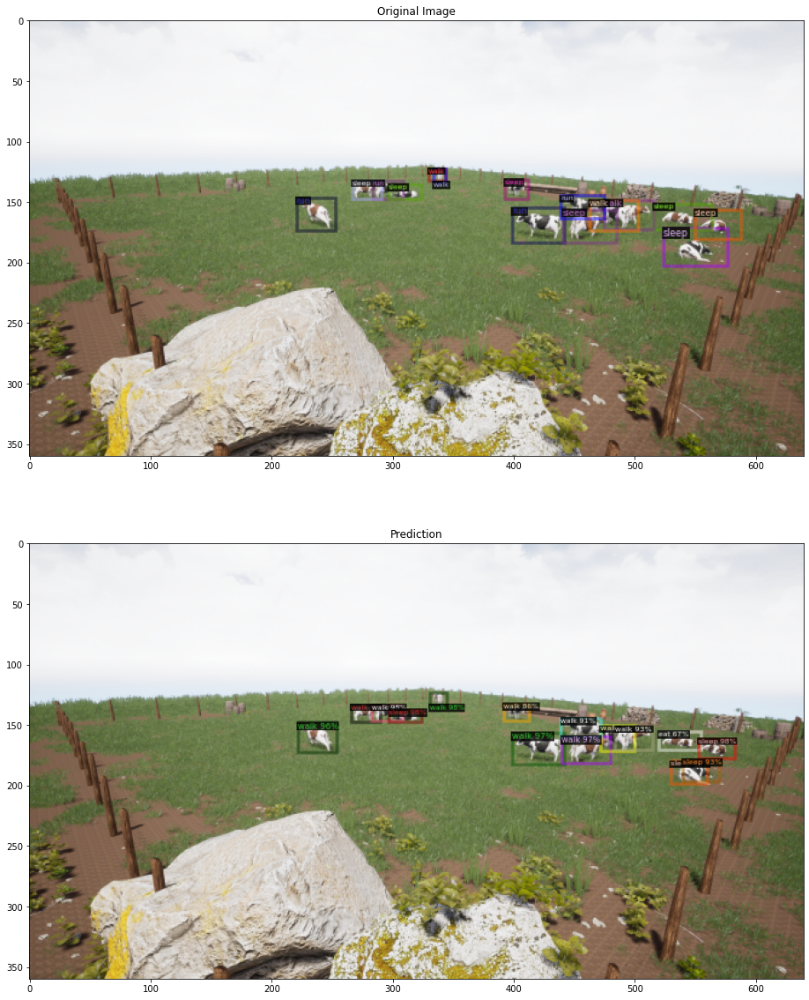

1


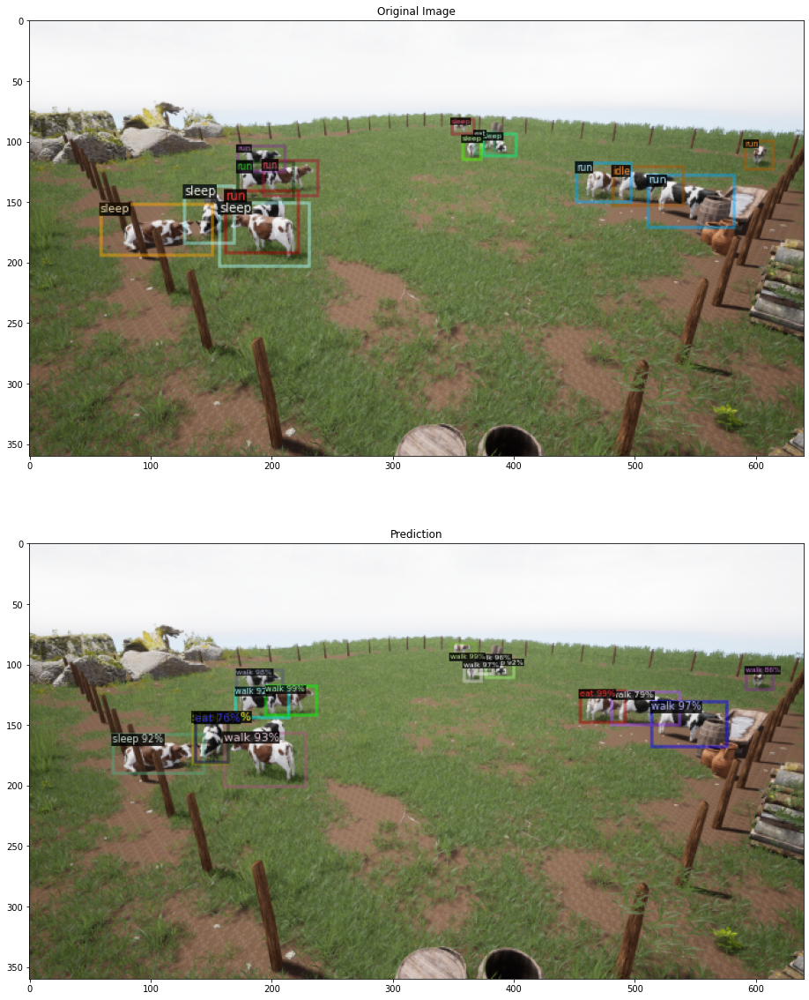

2


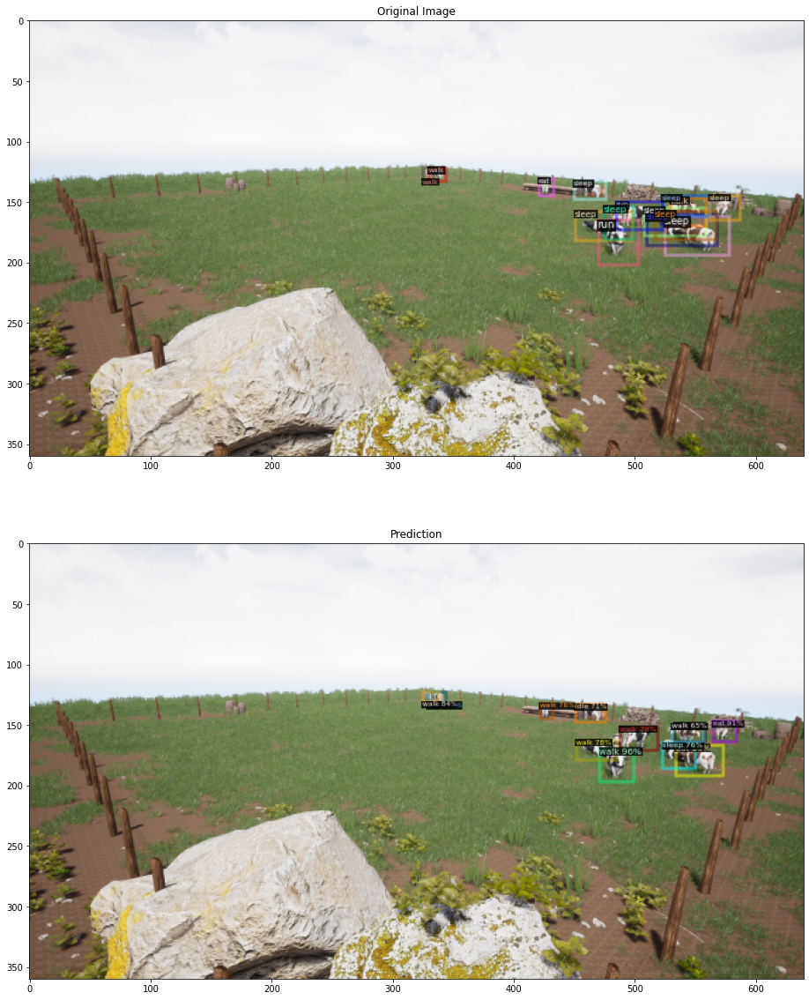

True

In [ ]:
random_testing = random.sample(dataset_test, 20)
for i in range(3):
    print(i)
    fig, ax = plt.subplots(2, 1, figsize =(40,20))
    img = cv2.imread(random_testing[i]['file_name'])

    visualizer = Visualizer(img[:, :, ::-1],
                          metadata=dataset_test_metadata,
                          scale=0.5)
    out = visualizer.draw_dataset_dict(random_testing[i])
    ax[0].imshow(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")
    outputs = predictor(img)
    visualizer_pred = Visualizer(img[:, :, ::-1],
                              metadata=dataset_test_metadata,
                              scale=0.5)
    pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
  
    ax[1].imshow(cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    ax[1].set_title("Prediction")
    plt.show()
cv2.imwrite('cow_demo.png',cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## **Test Model Performance**

We evaluate our model perfomance based on average precision.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("coco_test_dataset", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "coco_test_dataset")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/09 22:48:35 d2.data.datasets.coco]: Loaded 1120 images in COCO format from test_dataset_coco.json
[05/09 22:48:35 d2.data.build]: Distribution of instances among all 6 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   sleep    | 6402         |    eat     | 2350         |    idle    | 1090         |
|    run     | 3450         |    walk    | 3508         |   drink    | 0            |
|            |              |            |              |            |              |
|   total    | 16800        |            |              |            |              |
[05/09 22:48:35 d2.data.common]: Serializing 1120 elements to byte tensors and concatenating them all ...
[05/09 22:48:35 d2.data.common]: Serialized dataset takes 0.72 MiB
[05/09 22:48:35 d2.evaluation.evaluator]: Start inference on 1120 images
[05/09 22:48:39 d2.evaluation.evaluator]: Inference do

OrderedDict([('bbox',
              {'AP': 13.19641689184847,
               'AP-drink': nan,
               'AP-eat': 15.449865182412573,
               'AP-idle': 1.910184263185297,
               'AP-run': 9.73849744362552,
               'AP-sleep': 11.183001987784472,
               'AP-walk': 27.700535582234505,
               'AP50': 33.582164000685225,
               'AP75': 8.243402713596005,
               'APl': 17.00099699266695,
               'APm': 13.84893558531658,
               'APs': 7.307872906299787})])

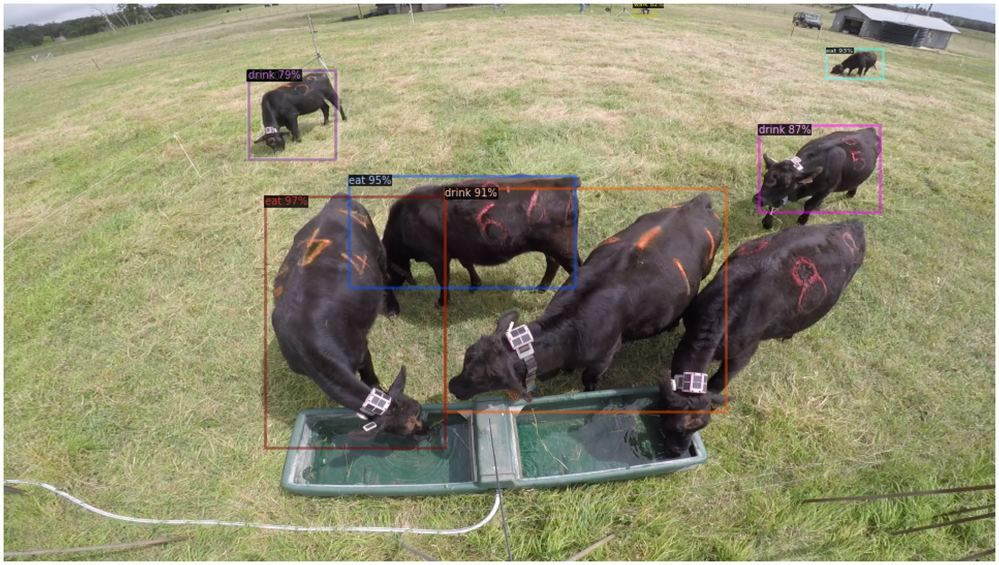

In [ ]:
fig, ax = plt.subplots(1, 1, figsize =(40,20))
img = cv2.imread("real_data/frame12564.png")

outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                                 metadata=dataset_train_metadata,
                                 scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
ax.grid(False)
ax.axis('off')
ax.imshow(cv2.cvtColor(pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## **Inference Speed**
Check for the inference speed

In [ ]:
import time
times = []
for i in range(20):
    start_time = time.time()
    outputs = predictor(img)
    delta = time.time() - start_time
    times.append(delta)
mean_delta = np.array(times).mean()
fps = 1 / mean_delta
print("Average(sec):{:.2f},fps:{:.2f}".format(mean_delta, fps))

Average(sec):0.32,fps:3.12


In [ ]:
# list of times to return to user
items = {}

def time_diff(date):
  """Extract the time difference over which the detections are tracked.
  This is useful in keeping track of the predictions over time
  """
  time_d = datetime.datetime.now() - datetime.datetime.fromisoformat(date)
  minutes = divmod(time_d.total_seconds(), 60)
  return minutes[0]

def return_activity(result):
  """
  SORT algorithm uses Kalman filter"""
  for obj in result:
    id, age, label, time = (obj.id, obj.age,obj.label, datetime.datetime.now())  
    cow_id = f'cow_{id}'
    if cow_id in items:

      item = items[cow_id]
      prev_activity = item['current_activity']
      item[str(prev_activity['age'])] = prev_activity
      item['current_activity'] = {'activity':label,'time':time,'age':age}
   
      if label in item:
        activity = item[label]
        time_d = time_diff(activity['time'])
        age_diff = activity['age'] - age
        activity['time'] = str(datetime.datetime.now())
        activity['age'] = age
        activity['age_diff'] = age_diff
        activity['time_diff'] = time_d
      else:
        activity = {}
        time_d = 0
        age_diff = 0
        activity['time'] = str(datetime.datetime.now())
        activity['age'] = age
        activity['age_diff'] = age_diff
        activity['time_diff'] = time_d
      item[label] =  activity    
    else:
      item = {}     
      item['current_activity'] = {'activity':label,'time':time,'age':age}
      activity = {}
      time_d = 0
      age_diff = 0
      activity['time'] = str(datetime.datetime.now())
      activity['age'] = age
      activity['age_diff'] = age_diff
      activity['time_diff'] = time_d
      item[label] =  activity  
    items[f'cow_{id}'] = item
  return items

## **Tracking**

Tracking the objects using the SORT algorithm

In [ ]:
import datetime
def get_norfair_detections(retina):
  """
  filter the object with class '1' i.e bicycle,
  and convert the retina's detections to 'Detection' Object

  returns:
    the number of object
    Detection object with bbox and score
  """
  norfair_detections: List[Detection] = []

  bboxes = retina['instances'].pred_boxes.tensor.cpu().numpy()
  scores = retina['instances'].scores.cpu().numpy()
  classes = retina['instances'].pred_classes.cpu().numpy()
  classnames = {0:'sleep',1:'eat',2:'idle',3:'run',4:'walk'}
  for p, score, c in zip(bboxes, scores, classes):
    if(score >= 0.3):
      # [[Xmin, ymin], [xmax, yamx]]
      bbox = np.array(
          [
              [p[0].item(), p[1].item()],
              [p[2].item(), p[3].item()]
          ]
      )
      scores = np.array([score.item(), score.item()])
      norfair_detections.append(
          Detection(points=bbox, scores=scores,label=classnames[int(c)])
      )
  return norfair_detections

In [ ]:
import subprocess

def euclidean_distance(detection, tracked_object):

    '''the Euclidean distance between two points in Euclidean space is the length of a line segment between the two points. 
      It can be calculated from the Cartesian coordinates of the points using the Pythagorean theorem
      '''

    return np.linalg.norm(detection.points - tracked_object.estimate)

# Norfair
def tracking(input_path):
  '''Nonfair uses SORT algorithm and tt is designed for online tracking applications
   where only past and current frames are available and the method produces object identities on the fly.
  '''

  video = Video(input_path=input_path)
  tracker = Tracker(distance_function=euclidean_distance, distance_threshold=20, hit_inertia_max=20,
          initialization_delay=8)
  
  vidcap = cv2.VideoCapture(input_path)
  fps = vidcap.get(cv2.CAP_PROP_FPS)

  for i,frame in enumerate(video):
      try:
        detections = predictor(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        detections = get_norfair_detections(detections)
        tracked_objects = tracker.update(detections=detections)
        draw_tracked_objects(frame, tracked_objects)
        draw_boxes(frame, detections=detections,random_color=True,line_width=2,draw_labels=True)
      except:
          continue
      if(tracked_objects == []):
        pass
      else:
        results = return_activity(tracked_objects)
      # print(type(frame))
      video.write(frame)

      if(i%20==0):
        print(i)
        print(fps)

      if i > fps*60:
        break


In [ ]:
input_path="pigs.mp4"
tracking('/content/drive/MyDrive/capstone/MultiviewC/arm01_gopro1.mp4')

Output()

0
5.0
20
5.0
40
5.0
60
5.0
80
5.0
100
5.0
120
5.0
140
5.0
160
5.0
180
5.0
200
5.0
220
5.0
240
5.0
260
5.0
280
5.0
300
5.0


In [ ]:
items

## **Track a video from YouTube**

In [ ]:
count = 4

In [ ]:

try: import yt_dlp
except:
  p=subprocess.Popen("pip install yt-dlp", shell=True)
  p.communicate()

from yt_dlp import YoutubeDL

count+=1
def track_youtube(yt_url):
  '''download a video from YouTube and stream
  '''

  file = 'file_'+str(count)

  ext = 'mp4'
  ydl_opts = {'outtmpl': file + '.%(ext)s', 'format': ext}

  URLS = [yt_url]

  with YoutubeDL(ydl_opts) as ydl:
      ydl.download(URLS)

  inpt = file+'.'+ext
  compressed = inpt+'_compressed'
  inpt_out = compressed+'_cut'+'.'+ext

  p = subprocess.Popen(f'ffmpeg -i {inpt} -ss 00:00:00 -t 00:2:00 -c:v copy -c:a copy {compressed}')
  
  p = subprocess.Popen(f'ffmpeg -y -i \
  {compressed}\
  -s 1280x720 -r 1 -c:v libx264 -b:v 600k -b:a 44100 -ac 2 -ar 22050 -tune fastdecode -preset ultrafast \
  {inpt_out}',shell=True)
  p.communicate()

  return inpt_out

video_file = download_youtube('https://www.youtube.com/watch?v=KjmuBo8xoCU')
tracking(inpt_out)

[youtube] KjmuBo8xoCU: Downloading webpage
[youtube] KjmuBo8xoCU: Downloading android player API JSON
[info] KjmuBo8xoCU: Downloading 1 format(s): 22
[download] Destination: file_16.mp4
[download] 100% of 311.03MiB in 00:16               


### **Watch the Video**

In [62]:
from IPython.display import HTML
from base64 import b64encode


mp4 = open('file_10_cut.mp4','rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=400 controls><source src={decoded_vid} type="video/mp4"></video>')

Starting job # 0 in a separate thread.


'/content/drive/MyDrive/capstone/MultiviewC'